In [1]:
import tensorflow as tf
import pandas as pd
import numpy as np
import os
import pathlib
import cv2
import string
from keras import layers, models
import matplotlib.pyplot as plt

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# Introduction
- Converting night into day is one of the most interesting applications in generative models, due to the great difficulty in recreating the scene during the day, especially in cases of extreme darkness, and thus the difficulty lies in imagining the scene during the day when the lighting is very weak.
- The proposed system focuses on using a CycleGan architecture that helps in reconstructing the scene in the daytime.
- The structure of the discriminator has been modified so that it can study the correctness of reshaping an object, only a part of which is visible due to extreme darkness and poor lighting. The discriminator was also designed to be able to recognize objects that are close to and far from the camera, so that it studies the correctness of the process of shaping the scene during the day.
- Through the proposed methodology, the discriminator attempts to study the relationship of the pixel with its neighbors, and whether the pixel's current value with its neighbors is correct or not (using kernel = 5 at each output convolutional layer) which helps in evaluating whether the pixel is correctly positioned with respect to its neighbors or not.
- Thus, in this way we try to overcome the problem of great difficulty in reconstructing the scene in extreme darkness.
- During the process of converting night into day, as long as we are studying images that include images of the road, it is possible that some objects may sometimes be close to the camera and others far from the camera, and all we seek is for each object to be recreated in the images as if it were in the daytime. Therefore, the discerner must recognize the entire object, whether it is close to the camera or far from the camera.

In [2]:
image_shape = (256, 256, 3)
kernel = 5
padding = 'same'
learning_rate = 0.0001
weight_decay = 6e-8
filter = 16
strides = 1
source_input = layers.Input(shape = image_shape, name = 'source')
target_input = layers.Input(shape = image_shape, name = 'target')

In [3]:
def inceptionModule(inputs, filter, kernel, padding, strides, activation, use_norm):
    x = inputs
    x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                    dilation_rate = 1)(x)
    x = layers.Activation(activation)(x)
    if use_norm:
        x = layers.GroupNormalization(groups = 1)(x)
    x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                      dilation_rate = 1)(x)
    x = layers.Activation(activation)(x)
    if use_norm:
        x = layers.GroupNormalization(groups = 1)(x)
    x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                      dilation_rate = 1)(x)
    x = layers.Activation(activation)(x)
    if use_norm:
        x = layers.GroupNormalization(groups = 1)(x)
    return x

In [4]:
def convolution(inputs, filters, kernel, padding, strides, activation, use_norm):
    x = inputs
    x = inceptionModule(x, filters, kernel, padding, strides, activation, use_norm)
    y = layers.Conv2D(filters, kernel_size = 1, padding = padding, strides = strides,
                                     activation = activation,)(inputs)
    if use_norm:
      y = layers.GroupNormalization(groups = 1)(y)

    x = layers.add([x, y])
    return x

In [5]:
def encoder(inputs, filters, padding, strides, activation, kernel, use_norm):
    conv = convolution(inputs, filters, kernel, padding, strides, activation, use_norm)
    return layers.Conv2D(filters, kernel_size = 1, padding = padding, strides = 2, activation = activation)(conv), conv
def decoder(inputs, skip, filters, padding, strides, kernel, activation, use_norm):
    x = layers.Conv2DTranspose(filters, kernel_size = kernel, padding = padding,
                              strides = 2, activation = activation,)(inputs)
    x = layers.add([x, skip])
    x = convolution(x, filters, kernel ,padding, strides, activation, use_norm)
    return x

# Generator Architecture

In [6]:
def U_net(inputs, filter, padding, strides, activation, kernel, use_norm, name, weights):
    x = inputs
    conv1, skip1 = encoder(x, filter, padding, strides, activation[0], kernel, use_norm)
    conv2, skip2 = encoder(conv1, filter*2, padding, strides, activation[0], kernel, use_norm)
    conv3, skip3 = encoder(conv2, filter*4, padding, strides, activation[0], kernel, use_norm)
    conv4, skip4 = encoder(conv3, filter*8, padding, strides, activation[0], kernel, use_norm)
    conv5, skip5 = encoder(conv4, filter*16, padding, strides, activation[0], kernel, use_norm)
    x = layers.Flatten()(conv5)
    x = layers.Dense(128, name = 'latent_space',
                     kernel_regularizer = tf.keras.regularizers.L2(0.001))(x)
    x = layers.Dense(conv5.shape[1]*conv5.shape[2]*conv5.shape[3],
                    kernel_regularizer = tf.keras.regularizers.L2(0.001),)(x)
    x = layers.Reshape((conv5.shape[1], conv5.shape[2], conv5.shape[3]))(x)
    dec1 = decoder(x, skip5, filter*16, padding, strides, kernel, activation[1], use_norm)
    dec2 = decoder(dec1, skip4, filter*8, padding, strides, kernel, activation[1], use_norm)
    dec3 = decoder(dec2, skip3, filter*4, padding, strides, kernel, activation[1], use_norm)
    dec4 = decoder(dec3, skip2, filter*2, padding, strides, kernel, activation[1], use_norm)
    dec5 = decoder(dec4, skip1, filter, padding, strides, kernel, activation[1], use_norm)
    dec5 = layers.concatenate([
    dec5,
    layers.GroupNormalization(groups = 1)(layers.Conv2DTranspose(filter, kernel_size = kernel, padding = 'same', strides = 16,
                                                       activation = activation[1])(dec1)),
                              ])
    output = layers.Conv2DTranspose(3, kernel_size = kernel, padding = padding,
                                   strides = 1,)(dec5)
    output = layers.Activation('sigmoid')(output)
    m = models.Model(inputs = inputs, outputs = output,
                    name = name)
    if weights:
      if name == 'xTOy':
          m.load_weights('/kaggle/working/g_target.h5')
      elif name == 'yTOx':
          m.load_weights('/kaggle/working/g_source.h5')
    return m

# Discriminator Architecture

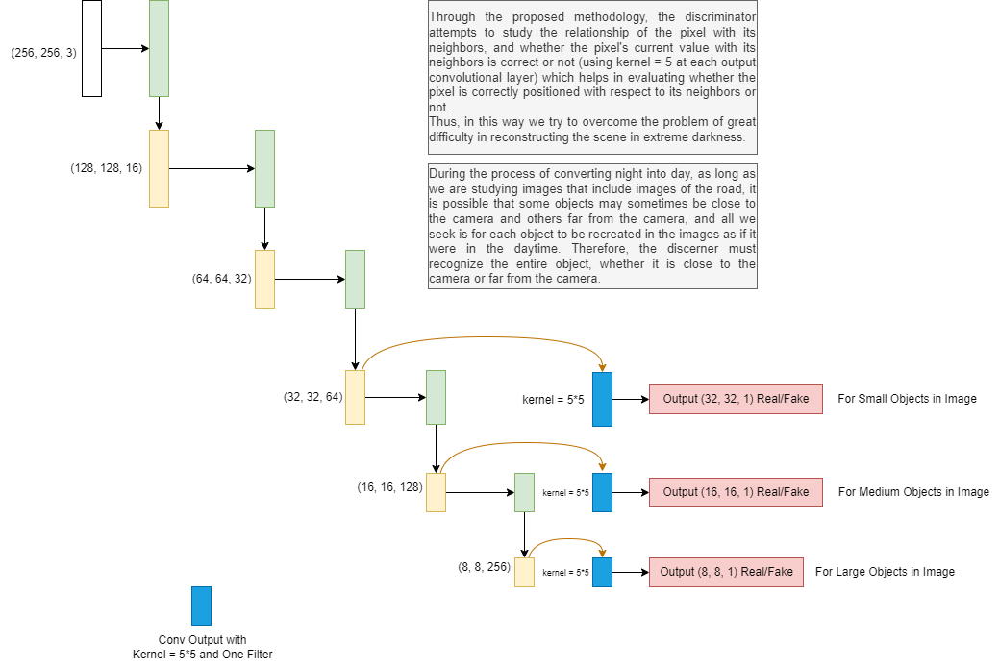

In [7]:
def Discriminator(inputs, filter, padding, strides, kernel, activation, use_norm,
                 name, weights):
    x = inputs
    conv1, skip1 = encoder(x, filter, padding, strides, activation, kernel, use_norm)
    conv2, skip2 = encoder(conv1, filter*2, padding, strides, activation, kernel, use_norm)
    conv3, skip3 = encoder(conv2, filter*4, padding, strides, activation, kernel, use_norm)
    conv4, skip4 = encoder(conv3, filter*8, padding, strides, activation, kernel, use_norm)
    conv5, skip5 = encoder(conv4, filter*16, padding, strides, activation, kernel, use_norm)
    output = layers.Conv2D(1, kernel_size = kernel, padding = padding,
                         strides = 1)(conv5)
    output1 = layers.Conv2D(1, kernel_size = kernel, padding = padding,
                         strides = 1)(conv4)
    output2 = layers.Conv2D(1, kernel_size = kernel, padding = padding,
                         strides = 1)(conv3)
    m = models.Model(inputs = inputs, outputs = [output, output1, output2,], name = name)
    if weights:
      if name == 'xx':
          m.load_weights('/kaggle/working/d_source.h5')
      elif name == 'yy':
          m.load_weights('/kaggle/working/d_target.h5')
    return m

In [8]:
g_target = U_net(source_input, filter, padding,
                        strides, ['LeakyReLU', 'relu'], kernel, use_norm = True,
                        name = 'xTOy', weights = True)
g_source = U_net(target_input, filter, padding, strides,
                       ['LeakyReLU', 'relu'], kernel, use_norm = True,
                       name = 'yTOx', weights = True)

In [9]:
# discriminator source
d_source = Discriminator(source_input, filter, 'same', 1, kernel, 'LeakyReLU', use_norm = False,
                        name = 'xx', weights = True)
# discriminator target
d_target = Discriminator(target_input, filter, 'same', 1, kernel, 'LeakyReLU', use_norm = False,
                        name = 'yy', weights = True)
d_source.compile(loss = ['mse',  'mse', 'mse'],
                 optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate))
d_target.compile(loss = ['mse',  'mse', 'mse'],
                 optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate))
d_source.trainable = False
d_target.trainable = False
# forward cyclegan
recon_target_forward = g_target(source_input)
d_target_re = d_target(recon_target_forward)
recon_source_forward = g_source(recon_target_forward)
# backward cyclegan
recon_source_backward = g_source(target_input)
d_source_re = d_source(recon_source_backward)
recon_target_backward = g_target(recon_source_backward)
# for identity
iden_target = g_target(target_input)
iden_source = g_source(source_input)
gan = models.Model(inputs = [source_input, target_input],
                  outputs = [d_target_re, d_source_re,
                            recon_source_forward,
                            recon_target_backward,
                            iden_source,
                            iden_target
                             ],
                  name = 'generative_gan')
loss_weights = [1, 1, 1, 1, 1, 1, 10, 10, 0.5, 0.5]
losses = ['mse', 'mse', 'mse', 'mse', 'mse', 'mse', 'mae', 'mae', 'mae', 'mae']
gan.compile(loss = losses, optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate*0.5,),
           loss_weights = loss_weights)

In [10]:
gan.output

[[<KerasTensor: shape=(None, 8, 8, 1) dtype=float32 (created by layer 'yy')>,
  <KerasTensor: shape=(None, 16, 16, 1) dtype=float32 (created by layer 'yy')>,
  <KerasTensor: shape=(None, 32, 32, 1) dtype=float32 (created by layer 'yy')>],
 [<KerasTensor: shape=(None, 8, 8, 1) dtype=float32 (created by layer 'xx')>,
  <KerasTensor: shape=(None, 16, 16, 1) dtype=float32 (created by layer 'xx')>,
  <KerasTensor: shape=(None, 32, 32, 1) dtype=float32 (created by layer 'xx')>],
 <KerasTensor: shape=(None, 256, 256, 3) dtype=float32 (created by layer 'yTOx')>,
 <KerasTensor: shape=(None, 256, 256, 3) dtype=float32 (created by layer 'xTOy')>,
 <KerasTensor: shape=(None, 256, 256, 3) dtype=float32 (created by layer 'yTOx')>,
 <KerasTensor: shape=(None, 256, 256, 3) dtype=float32 (created by layer 'xTOy')>]

In [11]:
gan.summary()

Model: "generative_gan"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 source (InputLayer)            [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 target (InputLayer)            [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 xTOy (Functional)              (None, 256, 256, 3)  19274323    ['source[0][0]',                 
                                                                  'yTOx[1][0]',      

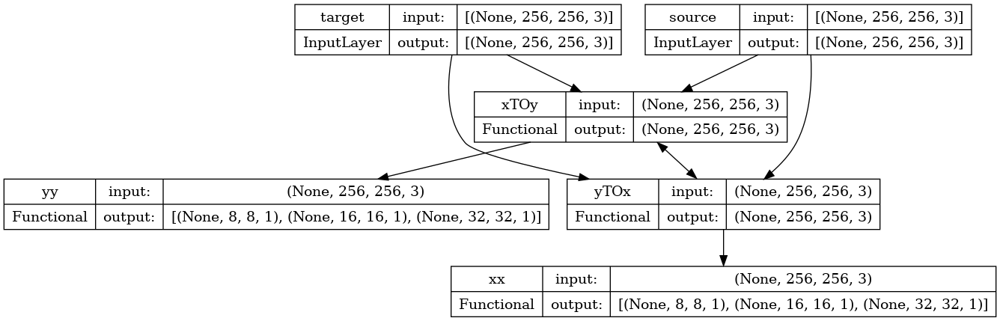

In [12]:
tf.keras.utils.plot_model(gan, show_shapes = True)

In [13]:
def read_images(pathes):
    images = []
    for img in pathes:
        img = cv2.imread(str(img))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))
        img = img/255
        images.append(img)
    return np.array(images)

In [14]:
source_pathes = np.array(sorted(list(pathlib.Path('/kaggle/input/solesensei_bdd100k/bdd100k/bdd100k/images/100k/train/trainA').glob('*.*'))))
target_pathes = np.array(sorted(list(pathlib.Path('/kaggle/input/solesensei_bdd100k/bdd100k/bdd100k/images/100k/train/trainB').glob('*.*'))))

In [15]:
def samples(G, start):
    images = G.predict(start, verbose = 0)
    allImages = np.vstack([start, images])
    plt.figure(figsize = (6, 3))
    for i in range(8):
        plt.subplot(2, 4, (i + 1))
        plt.imshow(allImages[i])
    plt.show()

In [16]:
def save_weight(g_target, g_source, d_source, d_target):
    g_target.save_weights('/kaggle/working/g_target.h5')
    g_source.save_weights('/kaggle/working/g_source.h5')
    d_source.save_weights('/kaggle/working/d_source.h5')
    d_target.save_weights('/kaggle/working/d_target.h5')

In [17]:
def getPatchGan(shape_):
  return np.vstack([tf.ones(shape = shape_),
                            tf.zeros(shape = shape_)])
def ones(shape_):
  return tf.ones(shape = shape_)

# Training CycleGAN

> **I have trained CycleGan For 20000 Epochs**

Epoch: 0/4210
source_discr: 0.39425572752952576, target_discr: 0.3181201219558716 source_gener: 0.5210054218769073, target_gener: 0.3907778362433116 
recon_target_loss :0.04852588474750519, recon_source_loss: 0.03799670189619064 ident_target: 0.08012385666370392, ident_source: 0.0587238110601902
Source to Target Samples


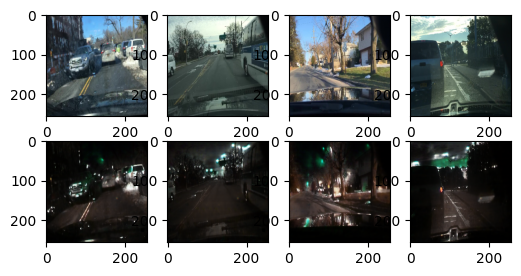

Target to Source Samples


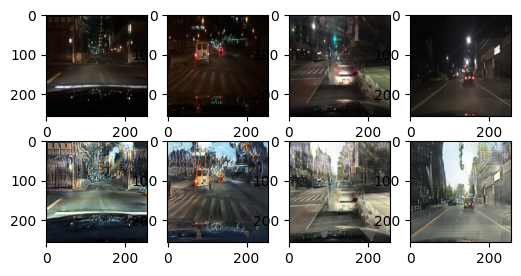

Epoch: 200/4210
source_discr: 0.4600495398044586, target_discr: 0.3174881041049957 source_gener: 0.6809456944465637, target_gener: 0.7816216349601746 
recon_target_loss :0.049075253307819366, recon_source_loss: 0.03245015814900398 ident_target: 0.08767847716808319, ident_source: 0.04918607324361801
Source to Target Samples


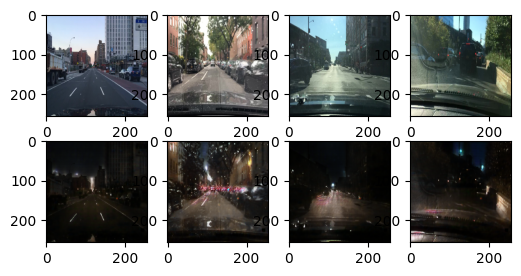

Target to Source Samples


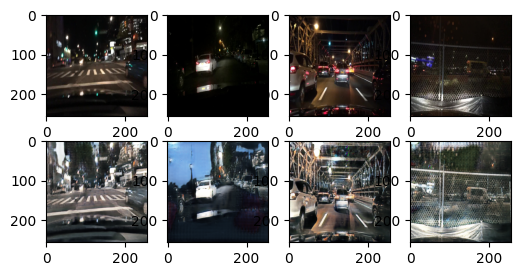

Epoch: 400/4210
source_discr: 0.36481985449790955, target_discr: 0.24210059642791748 source_gener: 0.7384247084458669, target_gener: 0.683698703845342 
recon_target_loss :0.06056542694568634, recon_source_loss: 0.03704705089330673 ident_target: 0.11479596793651581, ident_source: 0.057301223278045654
Source to Target Samples


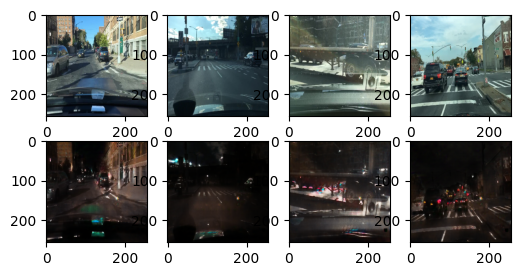

Target to Source Samples


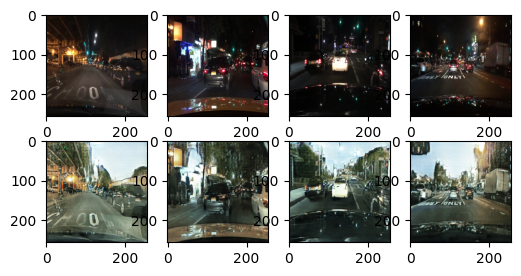

Epoch: 600/4210
source_discr: 0.4245723783969879, target_discr: 0.2925814688205719 source_gener: 0.7044170101483663, target_gener: 0.5851677854855856 
recon_target_loss :0.060444656759500504, recon_source_loss: 0.02766352891921997 ident_target: 0.08587044477462769, ident_source: 0.042446672916412354
Source to Target Samples


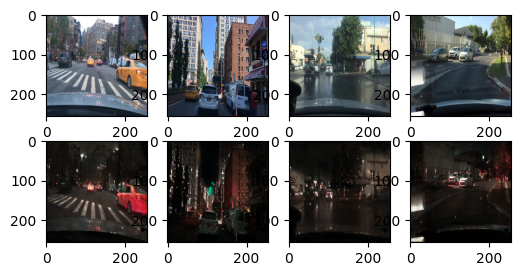

Target to Source Samples


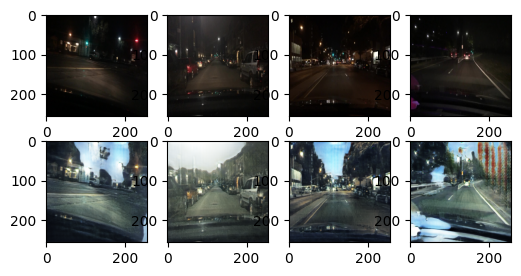

Epoch: 800/4210
source_discr: 0.3337547481060028, target_discr: 0.2375105619430542 source_gener: 0.7712417940298716, target_gener: 0.7182501554489136 
recon_target_loss :0.05076012760400772, recon_source_loss: 0.02168354205787182 ident_target: 0.08546977490186691, ident_source: 0.03360135480761528
Source to Target Samples


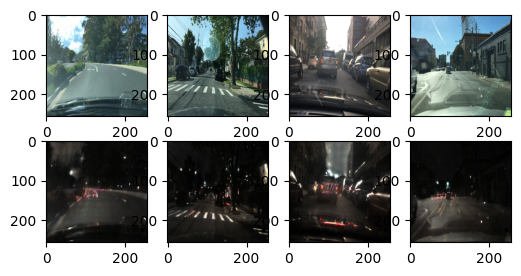

Target to Source Samples


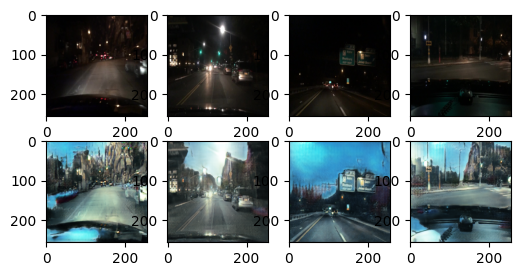

Epoch: 1000/4210
source_discr: 0.5728382468223572, target_discr: 0.18143592774868011 source_gener: 0.7910105387369791, target_gener: 0.5538684725761414 
recon_target_loss :0.052266884595155716, recon_source_loss: 0.025740252807736397 ident_target: 0.10653531551361084, ident_source: 0.048261601477861404
Source to Target Samples


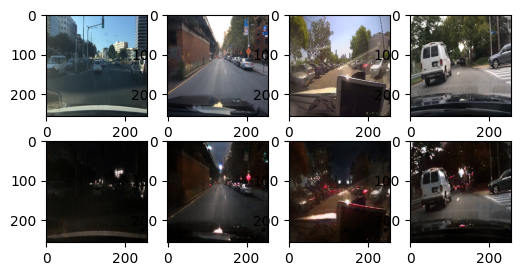

Target to Source Samples


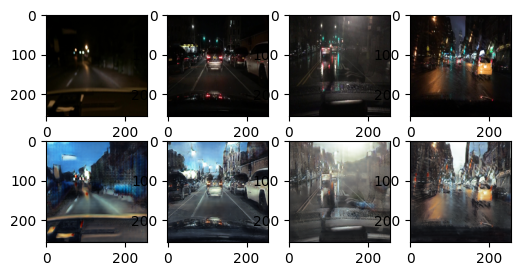

Epoch: 1200/4210
source_discr: 0.3952238857746124, target_discr: 0.19703686237335205 source_gener: 0.7162930071353912, target_gener: 0.3968808352947235 
recon_target_loss :0.05295400321483612, recon_source_loss: 0.02908540889620781 ident_target: 0.11944852769374847, ident_source: 0.03880051150918007
Source to Target Samples


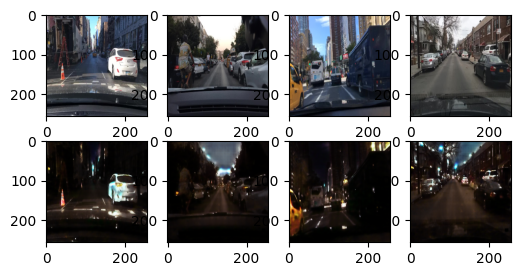

Target to Source Samples


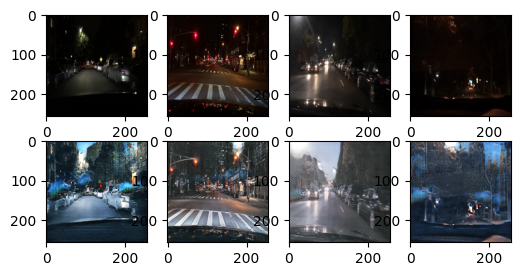

Epoch: 1400/4210
source_discr: 0.5308951139450073, target_discr: 0.3069608211517334 source_gener: 0.8263161977132162, target_gener: 0.46642570694287616 
recon_target_loss :0.05944371968507767, recon_source_loss: 0.024353455752134323 ident_target: 0.10525375604629517, ident_source: 0.04955083876848221
Source to Target Samples


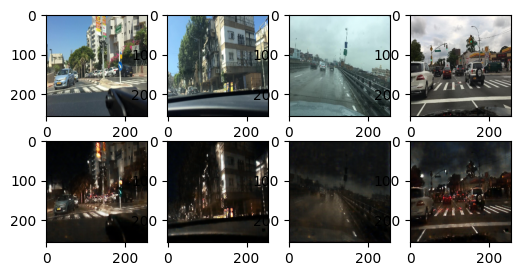

Target to Source Samples


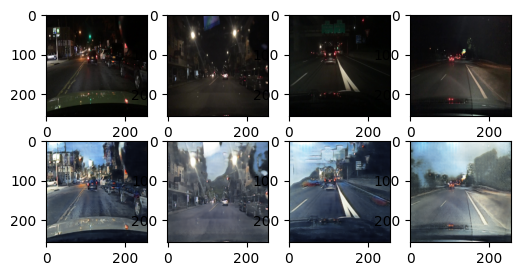

Epoch: 1600/4210
source_discr: 0.3806033134460449, target_discr: 0.3410671353340149 source_gener: 0.7702059149742126, target_gener: 0.6412214934825897 
recon_target_loss :0.0724930390715599, recon_source_loss: 0.02846251055598259 ident_target: 0.09094642102718353, ident_source: 0.04870612546801567
Source to Target Samples


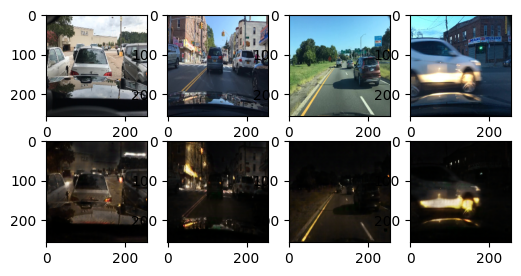

Target to Source Samples


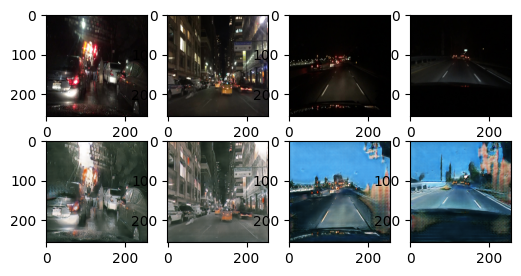

Epoch: 1800/4210
source_discr: 0.2163921296596527, target_discr: 0.2466295063495636 source_gener: 0.7753656506538391, target_gener: 0.7166493237018585 
recon_target_loss :0.05859316512942314, recon_source_loss: 0.03201831504702568 ident_target: 0.09706933796405792, ident_source: 0.04073789343237877
Source to Target Samples


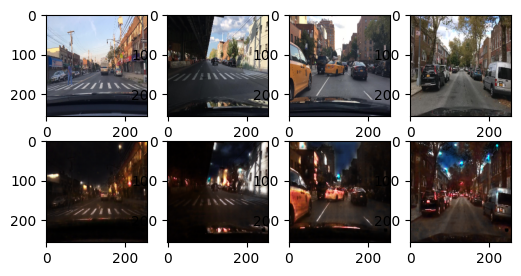

Target to Source Samples


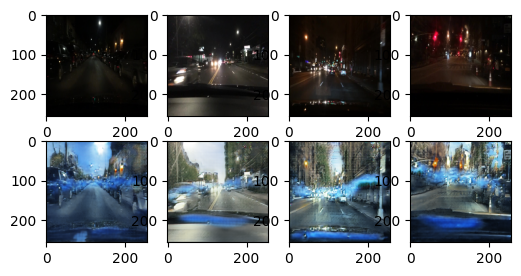

Epoch: 2000/4210
source_discr: 0.30512183904647827, target_discr: 0.20109985768795013 source_gener: 0.7154277662436167, target_gener: 0.6521911025047302 
recon_target_loss :0.05186072736978531, recon_source_loss: 0.028052272275090218 ident_target: 0.09485805779695511, ident_source: 0.04357694089412689
Source to Target Samples


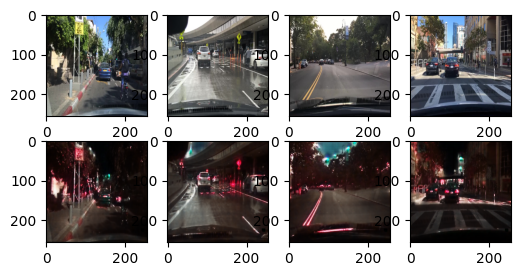

Target to Source Samples


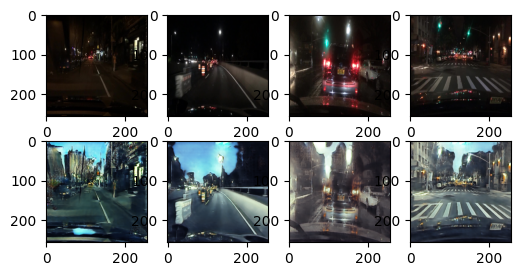

Epoch: 2200/4210
source_discr: 0.41938507556915283, target_discr: 0.3320891857147217 source_gener: 0.7154132227102915, target_gener: 0.641607383886973 
recon_target_loss :0.06148603931069374, recon_source_loss: 0.03362291306257248 ident_target: 0.0864417776465416, ident_source: 0.04504227265715599
Source to Target Samples


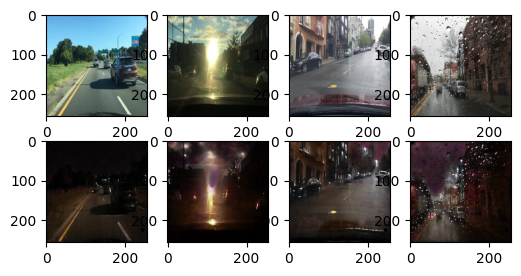

Target to Source Samples


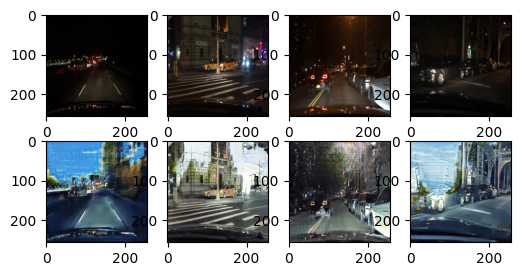

Epoch: 2400/4210
source_discr: 0.3980174660682678, target_discr: 0.2664197087287903 source_gener: 0.7669448753197988, target_gener: 0.6551350553830465 
recon_target_loss :0.05251003056764603, recon_source_loss: 0.032517530024051666 ident_target: 0.07911103963851929, ident_source: 0.050256114453077316
Source to Target Samples


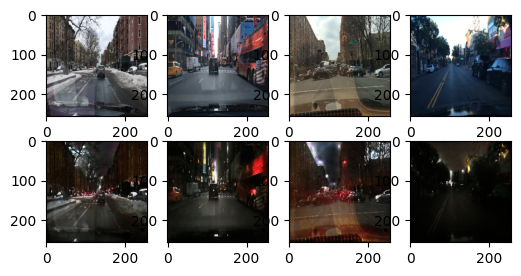

Target to Source Samples


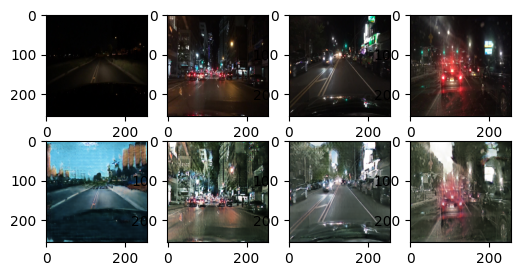

Epoch: 2600/4210
source_discr: 0.31062155961990356, target_discr: 0.18660959601402283 source_gener: 0.7917046546936035, target_gener: 0.6192486584186554 
recon_target_loss :0.05973929166793823, recon_source_loss: 0.030408835038542747 ident_target: 0.10906684398651123, ident_source: 0.04501637816429138
Source to Target Samples


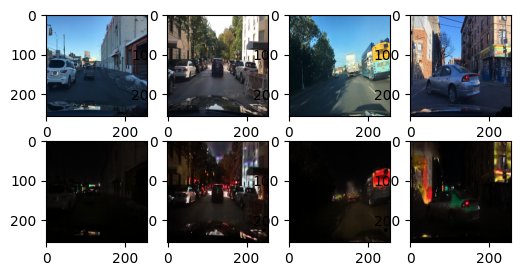

Target to Source Samples


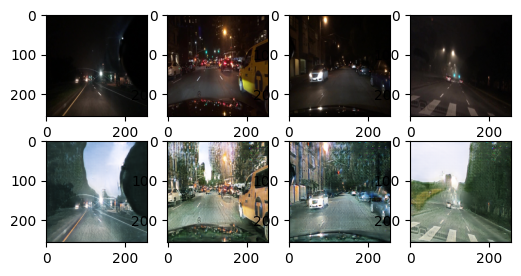

Epoch: 2800/4210
source_discr: 0.2617575526237488, target_discr: 0.5256329774856567 source_gener: 0.5425712863604227, target_gener: 0.6814444661140442 
recon_target_loss :0.0611233115196228, recon_source_loss: 0.03988213837146759 ident_target: 0.1035882905125618, ident_source: 0.07023096084594727
Source to Target Samples


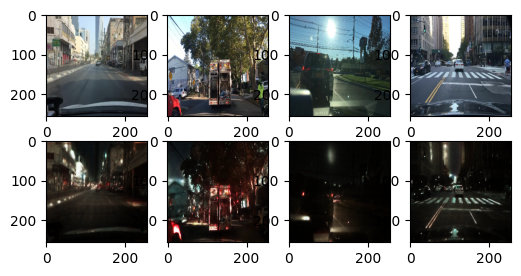

Target to Source Samples


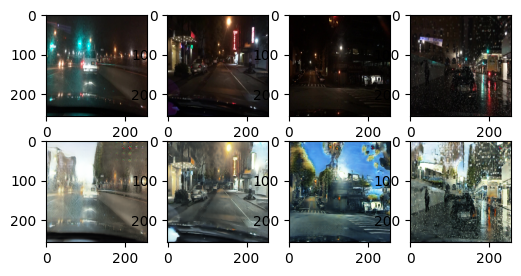

Epoch: 3000/4210
source_discr: 0.32638847827911377, target_discr: 0.30731111764907837 source_gener: 0.7621749043464661, target_gener: 0.6365219155947367 
recon_target_loss :0.05176929384469986, recon_source_loss: 0.04986072704195976 ident_target: 0.09267071634531021, ident_source: 0.0771297812461853
Source to Target Samples


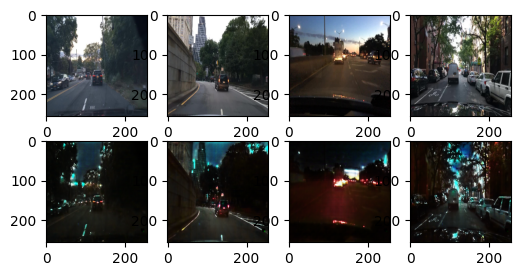

Target to Source Samples


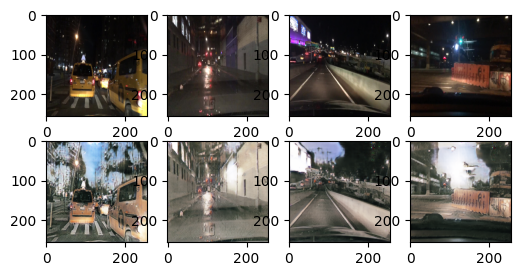

Epoch: 3200/4210
source_discr: 0.23273856937885284, target_discr: 0.3046015501022339 source_gener: 0.6684988935788473, target_gener: 0.7128788431485494 
recon_target_loss :0.059399042278528214, recon_source_loss: 0.041011661291122437 ident_target: 0.11171409487724304, ident_source: 0.08062153309583664
Source to Target Samples


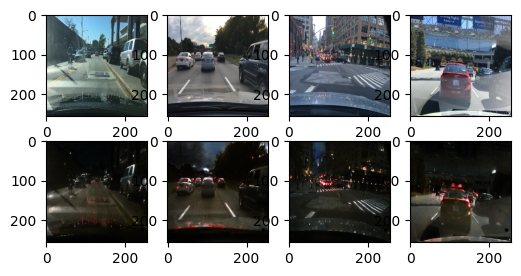

Target to Source Samples


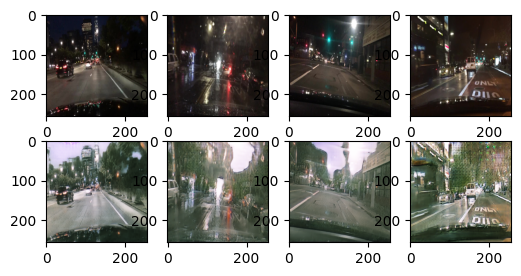

Epoch: 3400/4210
source_discr: 0.36835670471191406, target_discr: 0.23987433314323425 source_gener: 0.7637874980767568, target_gener: 0.5314260224501292 
recon_target_loss :0.06252723932266235, recon_source_loss: 0.033546529710292816 ident_target: 0.09960263967514038, ident_source: 0.07348451018333435
Source to Target Samples


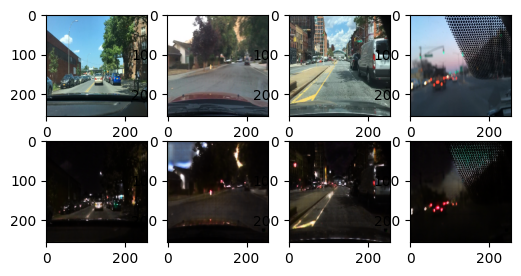

Target to Source Samples


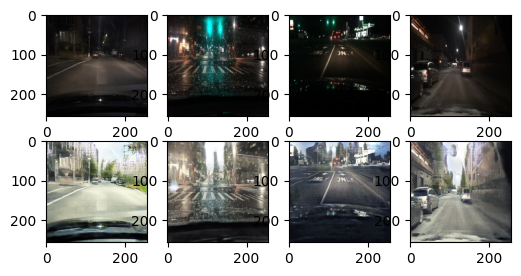

Epoch: 3600/4210
source_discr: 0.2935035824775696, target_discr: 0.31169503927230835 source_gener: 0.6469696760177612, target_gener: 0.8041195571422577 
recon_target_loss :0.05585487186908722, recon_source_loss: 0.024814298376441002 ident_target: 0.08781953155994415, ident_source: 0.038690753281116486
Source to Target Samples


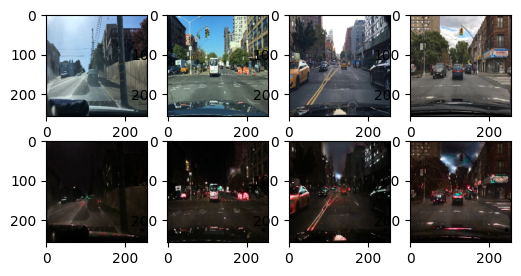

Target to Source Samples


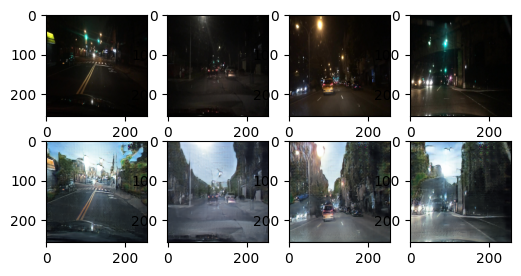

Epoch: 3800/4210
source_discr: 0.4166490137577057, target_discr: 0.32945549488067627 source_gener: 0.9188122749328613, target_gener: 0.6085917850335439 
recon_target_loss :0.06380477547645569, recon_source_loss: 0.027906956151127815 ident_target: 0.12496105581521988, ident_source: 0.05193211883306503
Source to Target Samples


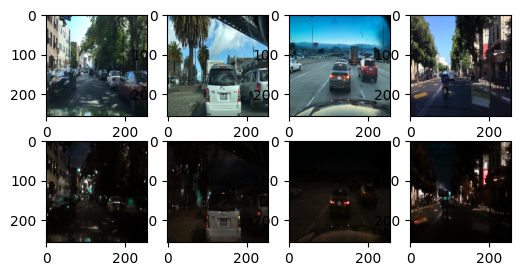

Target to Source Samples


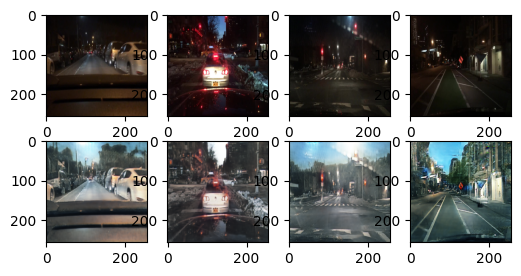

Epoch: 4000/4210
source_discr: 0.351187139749527, target_discr: 0.48548179864883423 source_gener: 0.6990187764167786, target_gener: 0.6931571066379547 
recon_target_loss :0.054537996649742126, recon_source_loss: 0.024190884083509445 ident_target: 0.08393439650535583, ident_source: 0.030224516987800598
Source to Target Samples


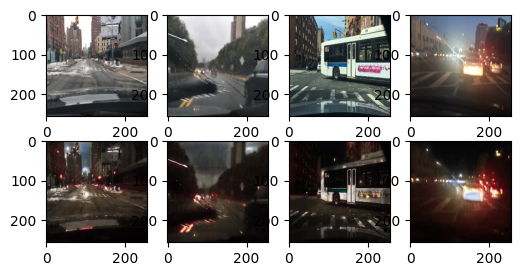

Target to Source Samples


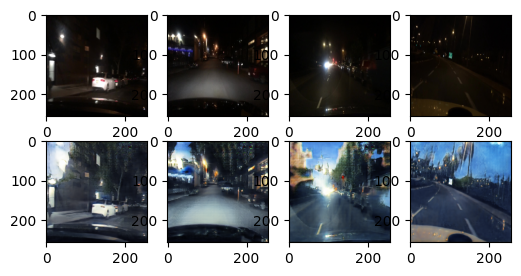

Epoch: 4200/4210
source_discr: 0.31682008504867554, target_discr: 0.21157756447792053 source_gener: 0.7708375255266825, target_gener: 0.6412161688009897 
recon_target_loss :0.05315116047859192, recon_source_loss: 0.03360244259238243 ident_target: 0.09518671035766602, ident_source: 0.049587182700634
Source to Target Samples


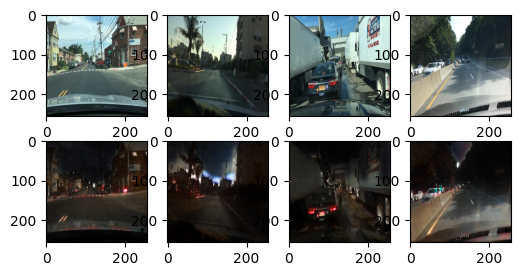

Target to Source Samples


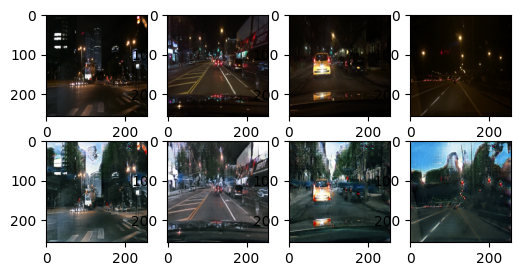

In [18]:
epochs = 4210
batch_size = 4
patchGan1 = (batch_size, 8, 8, 1)
patchGan2 = (batch_size, 16, 16, 1)
patchGan3 = (batch_size, 32, 32, 1)
for i in range(epochs):
    indexs = np.random.randint(5000, size = (batch_size,))
    source_images = read_images(source_pathes[indexs])
    target_images = read_images(target_pathes[indexs])
    real_source = source_images
    real_target = target_images
    fake_source = g_source.predict(real_target, verbose = 0)
    fake_target = g_target.predict(real_source, verbose = 0)
    allImagesSource = np.vstack([real_source, 
                                 fake_source])
    allImagesTarget = np.vstack([real_target, 
                                 fake_target])
    all_d_source, d1, d2, d3  = d_source.train_on_batch(allImagesSource, [
                                                                          getPatchGan(patchGan1),
                                                                          getPatchGan(patchGan2),
                                                                          getPatchGan(patchGan3)])
    all_d_target, dt1, dt2, dt3  = d_target.train_on_batch(allImagesTarget, [
                                                                             getPatchGan(patchGan1),
                                                                             getPatchGan(patchGan2),
                                                                             getPatchGan(patchGan3)])
    all_loss, loss_1_1, loss_1_2, loss_1_3, loss_2_1, loss_2_2, loss_2_3, loss_3, loss_4, loss_5, loss_6 = gan.train_on_batch([real_source, real_target],
                                                       [
                                                       [ones(patchGan1), 
                                                        ones(patchGan2), 
                                                        ones(patchGan3)],
                                                       [ones(patchGan1),
                                                        ones(patchGan2), 
                                                        ones(patchGan3)],
                                                       real_source,
                                                       real_target,
                                                       real_source,
                                                       real_target
                                                        ])
    if i%50 == 0:
        save_weight(g_target, 
                    g_source, 
                    d_source, 
                    d_target)
    if i%200 == 0:
        print('Epoch: {}/{}'.format(i, epochs))
        str_ = 'source_discr: {}, target_discr: {}'.format(all_d_source, all_d_target)
        str_2 = 'source_gener: {}, target_gener: {}'.format((loss_1_1 + loss_1_2 + loss_1_3 )/3,
                                                            (loss_2_1 + loss_2_2 + loss_2_3)/3)
        str_3 = 'recon_target_loss :{}, recon_source_loss: {}'.format(loss_3, loss_4)
        str_4 = 'ident_target: {}, ident_source: {}'.format(loss_5, loss_6)
        print(str_ + ' ' +str_2 + ' ')
        print(str_3 + ' ' + str_4)
        print('Source to Target Samples')
        samples(g_target, source_images)
        print('Target to Source Samples')
        samples(g_source, target_images)

In [19]:
def draw_compare(road_ligh,
                 road_night, type_):
  plt.figure(figsize = (12, 13))
  index = 0
  n = 0
  for i in range(16):
    plt.subplot(4, 4, (i + 1))
    if index == 0:
      plt.imshow(road_night[n])
      plt.title(type_[0])
      index = 1
    elif index == 1:
      plt.imshow(road_ligh[n])
      plt.title(type_[1])
      index = 0
      n = n + 1
  plt.legend()

# Results

In [20]:
def generator_samples(pathes_, m, type_):
  indexs = np.random.randint(15000, size = (8,))
  images = read_images(pathes_[indexs])
  draw_compare(np.squeeze(m.predict(images, verbose = 0)), images, type_)

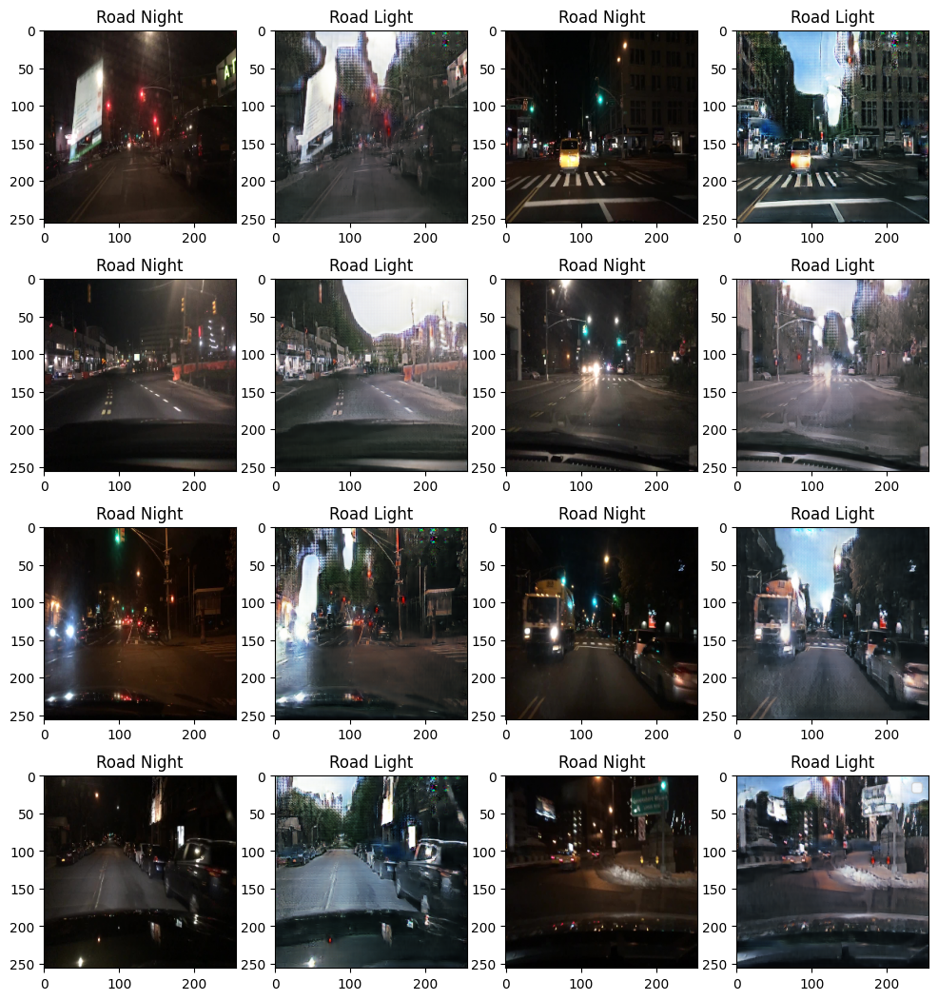

In [29]:
generator_samples(target_pathes, g_source, ['Road Night', 'Road Light'])

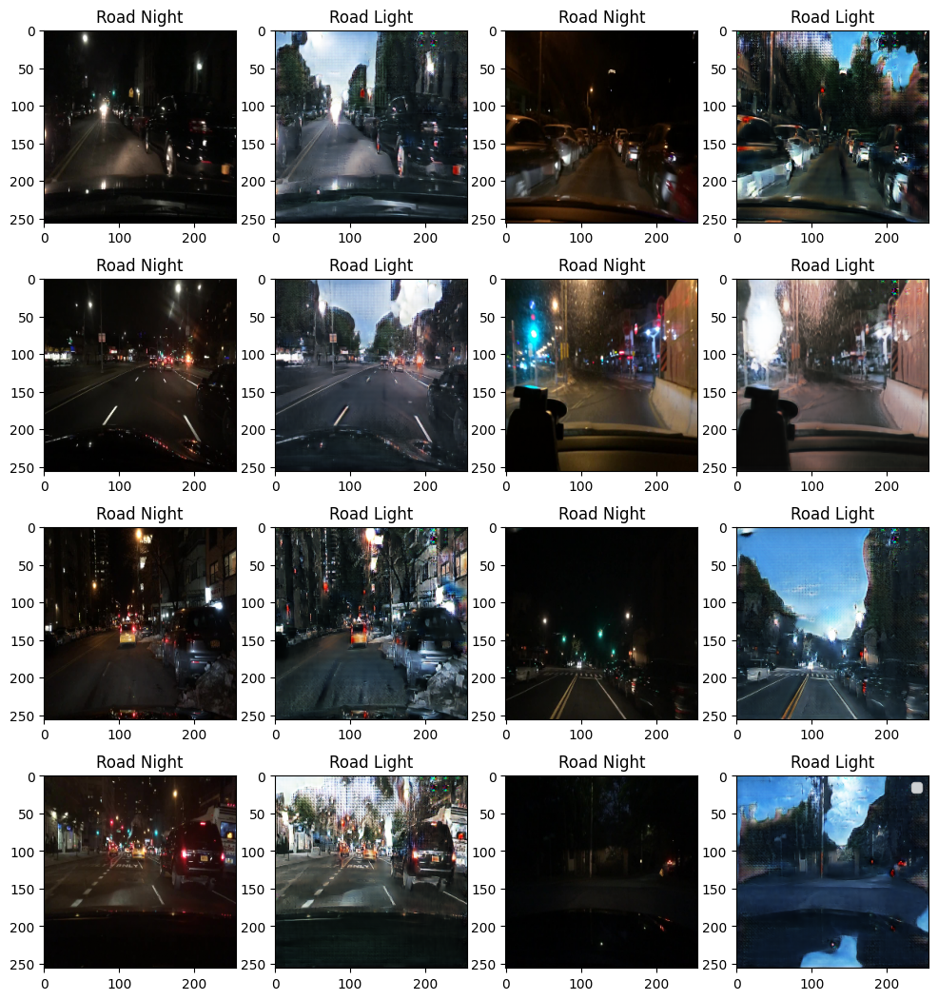

In [26]:
generator_samples(target_pathes, g_source, ['Road Night', 'Road Light'])

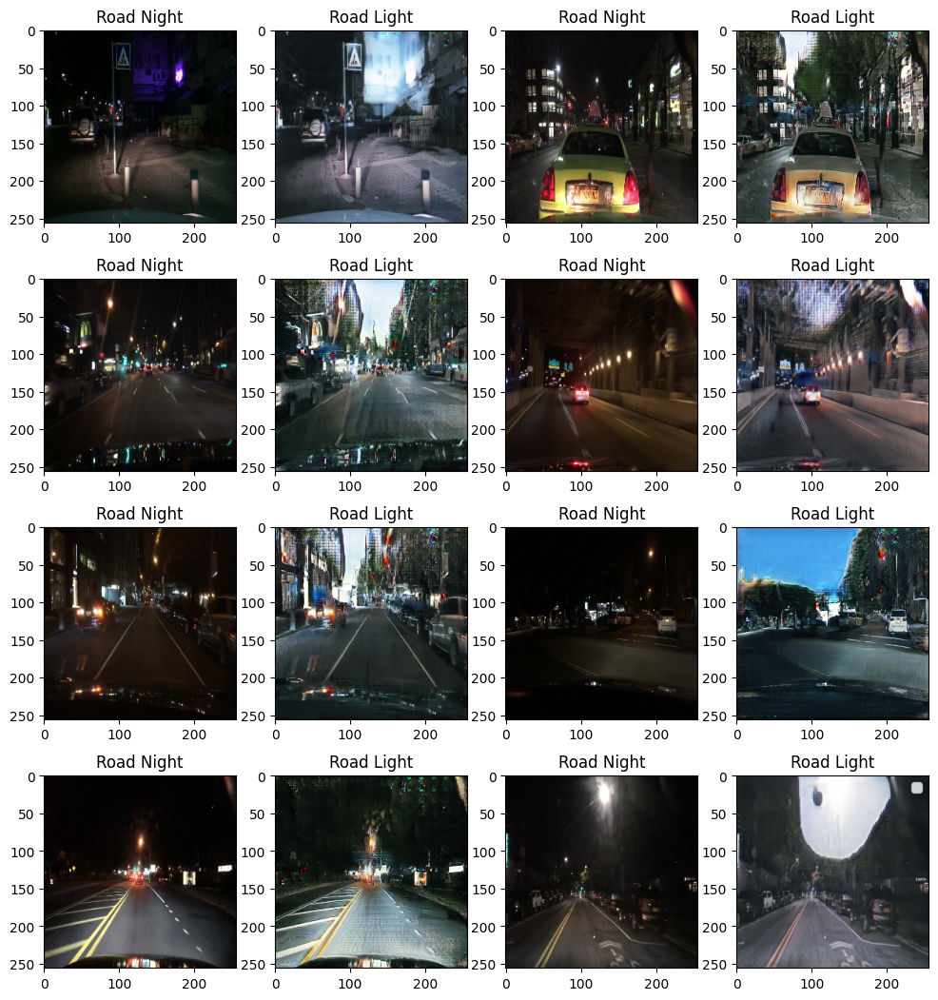

In [23]:
generator_samples(target_pathes, g_source, ['Road Night', 'Road Light'])